In [1]:
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import scipy.io
import glob,csv

from pykrige.ok import OrdinaryKriging
from mpl_toolkits.basemap import Basemap
%matplotlib inline

In [2]:
data=scipy.io.loadmat('ANHA4_Pa_part.mat')
NEMO_dep=data['NEMO_dep']
Pa_diss=data['Pa_part']
#print Pa_diss.shape
lons=data['lons']
lats=data['lats']
Pa_ini=np.empty([1,50,800,544])

coordinate_name=glob.glob('/ocean/xiaoxiny/research/data/Jasper/ANHA4_IC_T.nc')
coordinate_obj=nc.Dataset(coordinate_name[0])
nav_lon=coordinate_obj.variables['nav_lon'][:]
nav_lat=coordinate_obj.variables['nav_lat'][:]
ANHAdep=coordinate_obj.variables['deptht'][:]
#print ANHAdep
print ANHAdep[43]
nav_lon10=nav_lon[::10,::10]
nav_lat10=nav_lat[::10,::10]

3220.82


In [3]:
masked_name=glob.glob('/ocean/xiaoxiny/research/NEMO-code/NEMOGCM/CONFIG/myANHA/EXP00/ANHA4-EXH001_y2008m01d05_gridT.nc')
masked=nc.Dataset(masked_name[0])
mask=masked.variables['vosaline'][:]

In [4]:
'input boundinglat'
latlim=45
lim=45

In [36]:
what=np.empty([len(ANHAdep),len(Pa_diss[0,:]),len(Pa_diss[0,:])])
            #layer,distance,variance
whatt=np.empty([len(ANHAdep),len(Pa_diss[0,:]),len(Pa_diss[0,:])])
x_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
            #layer,x,y
y_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
z_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
def find(layer):
        x=lons[layer,:]
        y=lats[layer,:]
        z=Pa_diss[layer,:]
        
        x_ma=np.ma.masked_where(z<= 1e-200,x)
        x_ma=np.ma.masked_where(np.isnan(x_ma),x_ma)
        y_ma=np.ma.masked_where(z<= 1e-200,y)
        y_ma=np.ma.masked_where(np.isnan(y_ma),y_ma)
        z_ma=np.ma.masked_where(z<= 1e-200,z)
        z_ma=np.ma.masked_where(np.isnan(y_ma),z_ma)        
        #x_ma=x_ma.compressed()
        #y_ma=y_ma.compressed()
        #z_ma=z_ma.compressed()
        
        
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        x_dis,y_dis = m(x_ma, y_ma)
        x_lon,y_lat = m(nav_lon, nav_lat)
        a,b=m(0,90)
        
        xx_lon=np.empty([800,544])
        yy_lat=np.empty([800,544])
        xx_dis=np.empty([len(x_dis)])
        yy_dis=np.empty([len(x_dis)])

        for j in range (544):
            for i in range (800):
                xx_lon[i,j]=x_lon[i,j]-a
                yy_lat[i,j]=y_lat[i,j]-b
        
        xx_lon_ma=np.ma.masked_where(nav_lat<45,xx_lon)
        yy_lat_ma=np.ma.masked_where(nav_lat<45,yy_lat)

        xx_dis=np.ma.masked_where(np.isnan(xx_dis),xx_dis)
        yy_dis=np.ma.masked_where(np.isnan(yy_dis),yy_dis)
        z_ma=np.ma.masked_where(np.isnan(yy_dis),z_ma)
        
        for k in range (len(xx_dis)):
            xx_dis[k]=x_dis[k]-a
            yy_dis[k]=y_dis[k]-b        

        xxx_dis=xx_dis.compressed()
        yyy_dis=yy_dis.compressed()
        zzz_ma=z_ma.compressed()
        
#        woww=[np.empty([len(xxx_dis),len(xxx_dis)])]
#        wow=np.empty([len(xxx_dis),len(xxx_dis)])
#        c=np.average(zzz_ma)
#        for k in range (len(xxx_dis)):
#            for j in range (len(xxx_dis)):
#                woww[k,j]=((xxx_dis[k]-xxx_dis[j])**2+(yyy_dis[k]-yyy_dis[j])**2)**0.5
#                wow[k,j]=0.5*c*(zzz_ma[k]-zzz_ma[j])**2
                
#        what[layer,:,:]=wow[:,:]
#        whatt[layer,:,:]=woww[:,:]
        for applen in range(len(xxx_dis)):
            x_all.append(xxx_dis[applen])
            y_all.append(yyy_dis[applen])
            z_all.append(zzz_ma[applen])
        #print z_all

In [6]:
for i in range (40):#no data below layer 43
    find(i)

Plotting Enabled

Adjusting data for anisotropy...
Initializing variogram model...
Using 'linear' Variogram Model
Slope: 2.97437831584e-11
Nugget: 1.37470881697e-05 



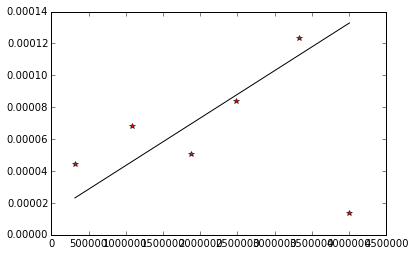

/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:239: RuntimeWarning: invalid value encountered in sqrt
  sigma[n] = np.sqrt(ss_)
/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:243: RuntimeWarning: divide by zero encountered in divide
  epsilon = delta/sigma


Calculating statistics on variogram model fit...
Q1 = nan
Q2 = nan
cR = nan 

Updating variogram mode...
Using 'linear' Variogram Model
Slope: 4.58487055697e-11
Nugget: 8.25386108455e-06 



/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:243: RuntimeWarning: invalid value encountered in divide
  epsilon = delta/sigma
/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:257: RuntimeWarning: divide by zero encountered in log
  return Q2 * np.exp(np.sum(np.log(sigma**2))/sigma.shape[0])


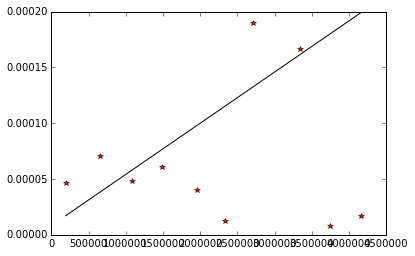

Calculating statistics on variogram model fit...
Q1 = nan
Q2 = nan
cR = nan 



In [7]:
OK = OrdinaryKriging(x_all,y_all, z_all, variogram_model='linear', verbose=True, enable_plotting=True)
OK.update_variogram_model('linear',variogram_parameters=None,nlags=10,anisotropy_angle=0)

In [5]:
'''Input slope and intercept'''
slope=2.97437831584e-11
inter=1.37470881697e-05

In [6]:
def write_nc(layer):
        '''a function for  interpolation'''
        x=lons[layer,:]
        y=lats[layer,:]
        z=Pa_diss[layer,:]

        z_ma=np.ma.masked_where(z<= 1e-200,z)
        z_ma=np.ma.masked_where(np.isnan(z_ma),z)
        x_ma=np.ma.masked_where(np.isnan(z_ma),x)
        y_ma=np.ma.masked_where(np.isnan(z_ma),y)

        print ('z_ma %s'%z_ma)
        print ('x_ma %s'%x_ma)
        print ('y_ma %s'%y_ma)
      
        x_ma=x_ma.compressed()
        y_ma=y_ma.compressed()
        z_ma=z_ma.compressed()
        
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        x_dis,y_dis = m(x_ma, y_ma)
        x_lon,y_lat = m(nav_lon, nav_lat)
        a,b=m(0,90)
        
        xx_lon=np.empty([800,544])
        yy_lat=np.empty([800,544])
        xx_dis=np.empty([len(x_dis)])
        yy_dis=np.empty([len(x_dis)])

        for j in range (544):
            for i in range (800):
                xx_lon[i,j]=x_lon[i,j]-a
                yy_lat[i,j]=y_lat[i,j]-b
        
        
        for k in range (len(xx_dis)):
            xx_dis[k]=x_dis[k]-a
            yy_dis[k]=y_dis[k]-b        

        xxx_dis=xx_dis#.compressed()
        yyy_dis=yy_dis#.compressed()
        zzz_ma=z_ma#.compressed()
        
        print ('zzz_ma %s'%zzz_ma.shape)
        print ('xxx_dis %s'%xxx_dis.shape)
        print ('yyy_dis %s'%yyy_dis.shape)
        
        OK = OrdinaryKriging(xxx_dis,yyy_dis, zzz_ma, variogram_model='linear', verbose=False, enable_plotting=False)
        OK.update_variogram_model('linear',variogram_parameters=[slope,inter],nlags=7,anisotropy_angle=0)
        
        Pa_interp, ss = OK.execute('points',xx_lon, yy_lat)
        Pa_interp=Pa_interp.reshape(800,544)
        Pa_interp=np.ma.masked_where(np.ma.getmask(mask[0,layer,:,:]),Pa_interp)
        #print Pa_interp
        
        fig=plt.figure(figsize=(8, 8)); ax=plt.gca()
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        m.drawcoastlines()
        m.fillcontinents(color = '0.9',alpha=0.95)
        m.drawparallels(np.arange(-80.,81.,10.),labels=[1, 0, 0, 0])
        m.drawmeridians(np.arange(-180.,181.,20.),labels=[0, 0, 0, 1])
        x,y = m(nav_lon, nav_lat)
        x10,y10 = m(nav_lon10, nav_lat10)
        m.plot(x10[-50:,:],y10[-50:,:],x10[-50:,:].T,y10[-50:,:].T,color='k',linewidth=0.1,)
        CS = m.pcolor(x[300:-1,:],y[300:-1,:],Pa_interp[300:-1,:],cmap=plt.cm.YlOrBr)
        CBar = plt.colorbar(CS, shrink=0.8)
        #m.scatter(x[0,90],y[0,90],color='yellow',s=100)
        x_mma=x_ma#.compressed()
        y_mma=y_ma#.compressed()
        for j in range(len(x_mma)):
            x2,y2= m(x_mma[j], y_mma[j])
            cmm = plt.cm.get_cmap('YlOrBr')
            m.scatter(x2,y2,c=zzz_ma[j],vmin=np.min(Pa_interp[300:-1,:]),vmax=np.max(Pa_interp[300:-1,:]),cmap=cmm,s=40)
        #fig.savefig('Part. Pa (Layer:%s).pdf'%layer)
        plt.title('Part. Pa (Layer %s, Depth %.2f m)'%(layer+1,ANHAdep[layer]))
        fig.savefig('/ocean/xiaoxiny/research/writings/Figures/PartPa/Part. Pa (Layer %s).png'%layer,dpi=100)
        
        Pa_ini[-1,layer,:,:]=Pa_interp
        if layer==43:
            Pa_ini[-1,43:-1,:,:]=Pa_interp
            Pa_ini[-1,-1,:,:]=Pa_interp
            print 'set values of layer 43 for the rest'
        plt.show()

#part Pa interpolation_result

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


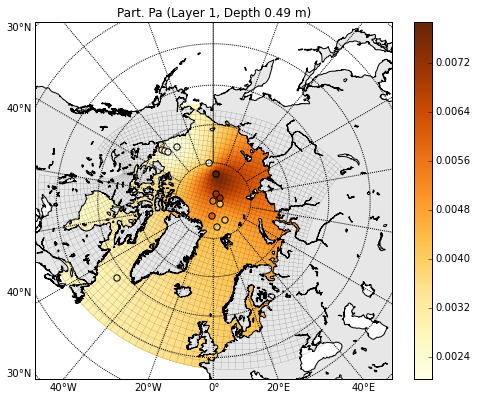

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


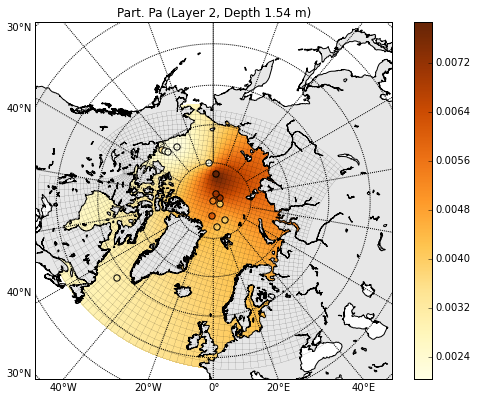

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


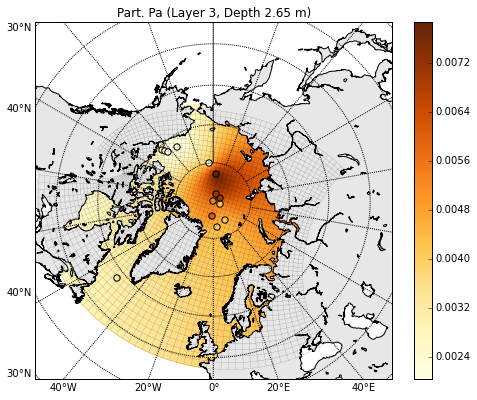

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


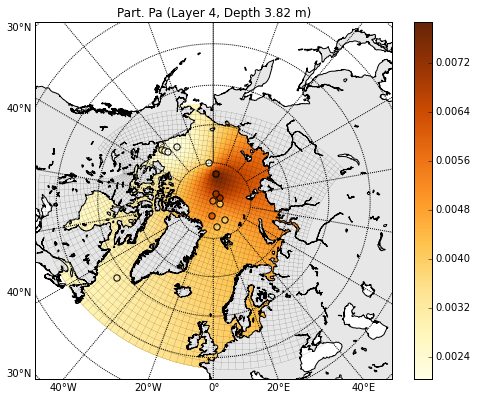

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


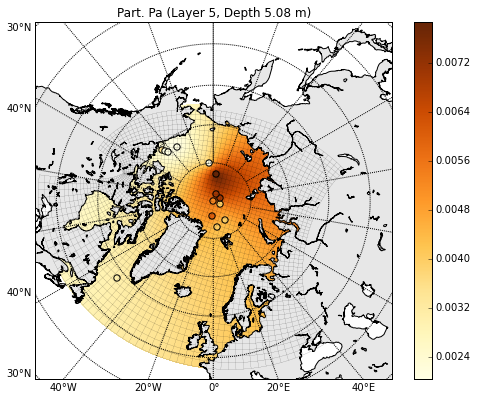

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


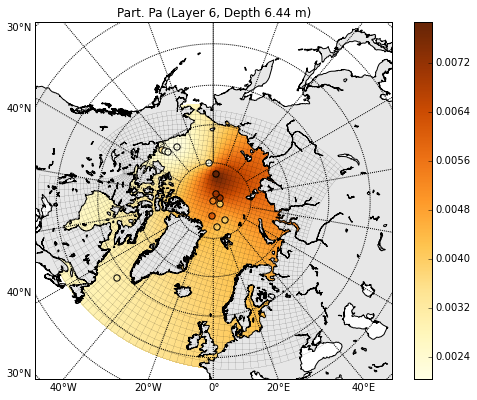

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


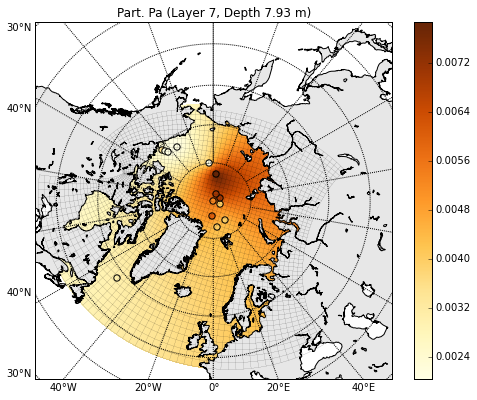

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


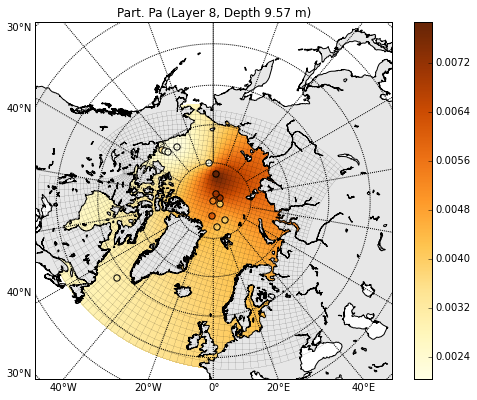

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002 0.0106 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


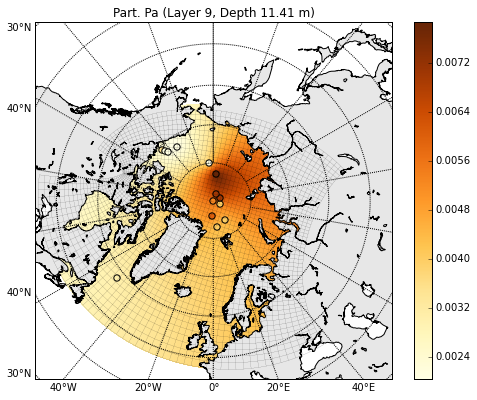

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.002028935106495666 0.0106 0.0053
 0.0034721123 0.0020134811 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


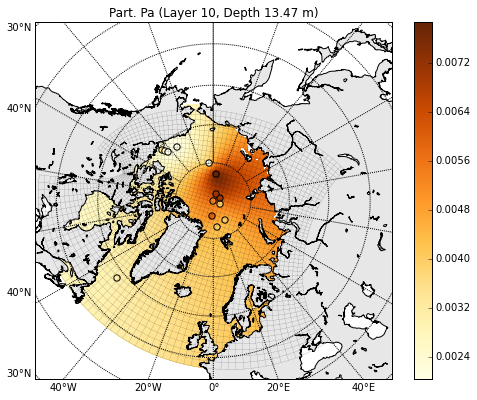

In [7]:
for i in range(0,10,1):
    write_nc(i)

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.0020692859969608413 0.0106 0.0053
 0.0034721123 0.0020134811 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


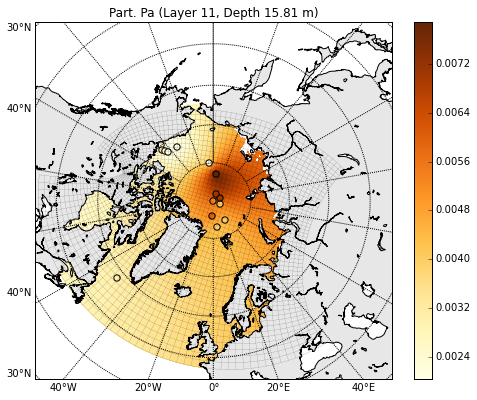

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.0021499877778911928 0.0106 0.0053
 0.0034721123 0.0020134811 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


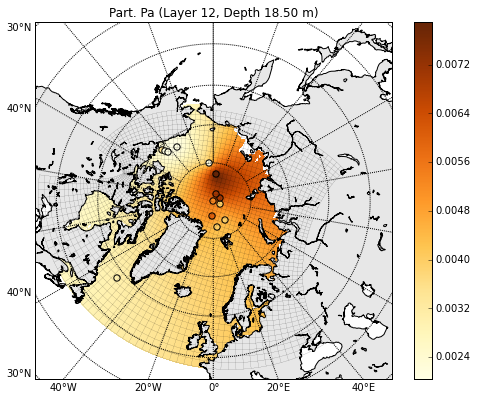

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.0021903386683563685 0.0106 0.0053
 0.0034721123 0.0020134811 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


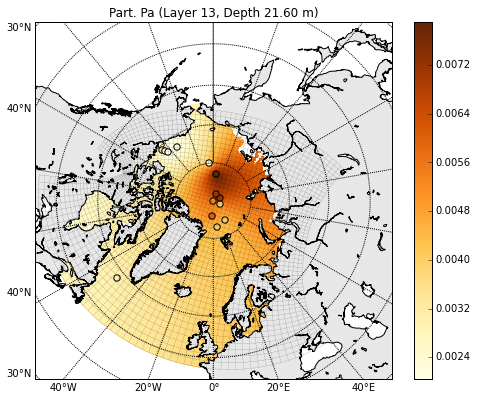

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.0022710404492867196 0.008478064050321463
 0.0053 0.0034721123 0.0020134811 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


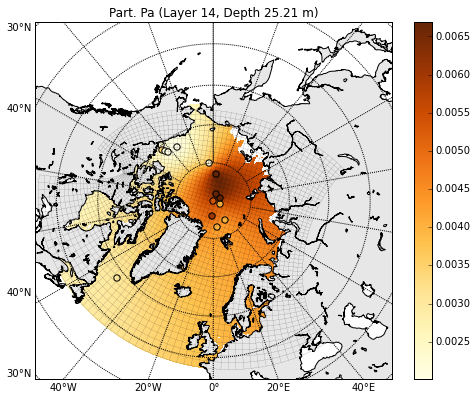

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004 0.003 0.004
 0.0023 0.0017000000000000001 0.0023517422302170706 0.0056131508272939945
 0.0053 0.0034721123 0.0020134811 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


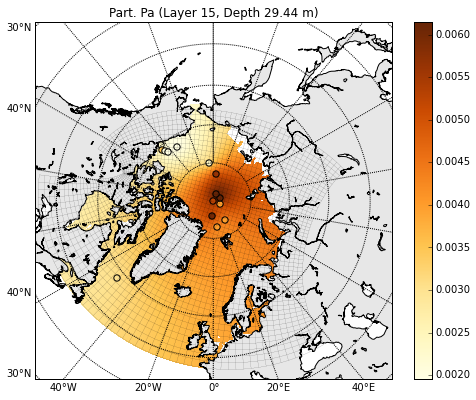

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004
 0.0030625565525189947 0.004 0.0023 0.0017000000000000001
 0.0024727949016125975 0.0030462815782764286 0.0053 0.0034721123
 0.0020134811 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


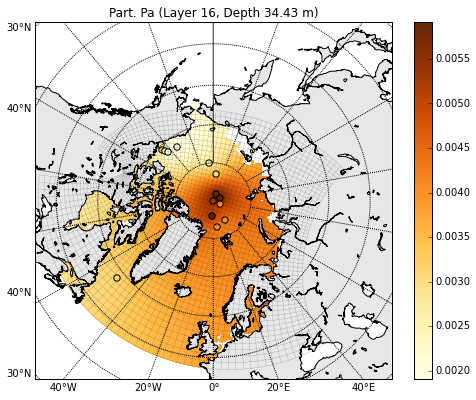

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004
 0.003144411216034065 0.004 -- 0.0017000000000000001 0.0025938475730081243
 0.0029168984004622847 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


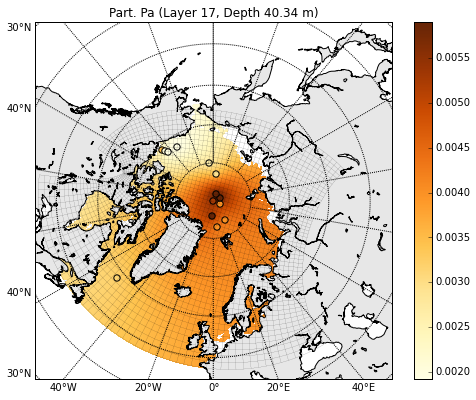

z_ma [0.004 0.006999999999999999 0.006999999999999999 0.006 0.004
 0.003253550767387492 0.004 -- 0.0017000000000000001 0.002755251134868827
 0.0027443874967100932 0.0053 0.0034721123 0.0020134811
 0.0013322508000000002 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


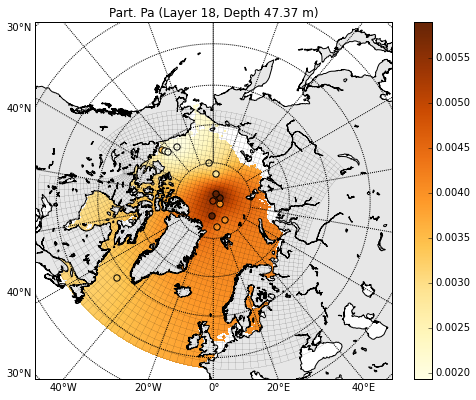

z_ma [0.004 0.006999999999999999 0.006988025950418079 0.006 0.005151561454078443
 0.0033626903187409197 0.004 -- 0.0017000000000000001 0.0029166546967295294
 0.0025718765929579014 0.0053 0.003347563616788039 0.0020134811
 0.0013468862097448715 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


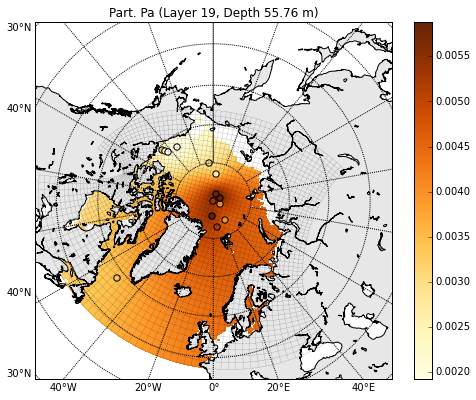

z_ma [0.004 0.006999999999999999 0.006966804370988245 0.006 0.007192471064387534
 0.003499114757932704 0.004 -- 0.0017000000000000001 0.0031184091490554077
 0.0025308172312320256 0.0053 0.003126826283475632 0.0020134811
 0.0013728245114250216 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


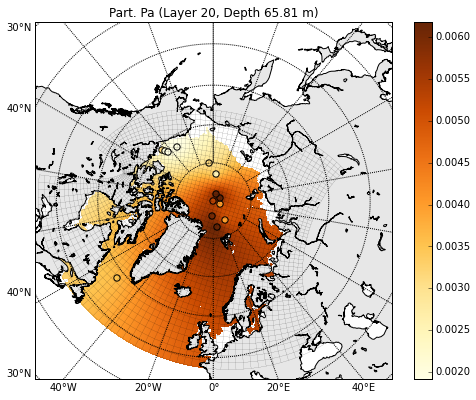

In [8]:
for i in range(10,20,1):
    write_nc(i)

z_ma [0.004 0.006999999999999999 0.006937094159786479 0.006 0.010049744518820262
 0.0036901089728012017 0.004 -- 0.0017000000000000001 0.0034008653823116367
 0.0034332648964856783 0.0053 0.0028177940168382623 0.0020134811
 0.001409138133777232 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


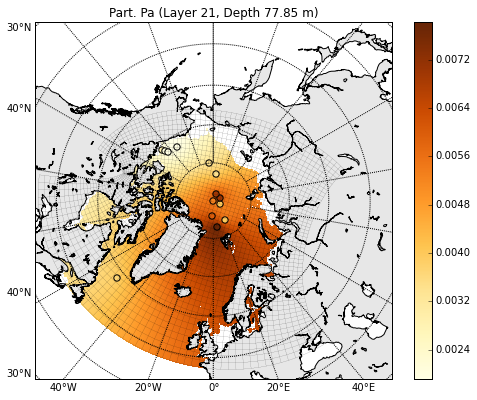

z_ma [0.004 0.006999999999999999 0.006907383948584713 0.006 0.01290701797325299
 0.0038811031876696996 0.004 -- 0.0017618205930775947 0.003066138843156052
 0.004335712561739331 0.0053 0.0025087617502008923 0.0020134811
 0.0014454517561294422 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


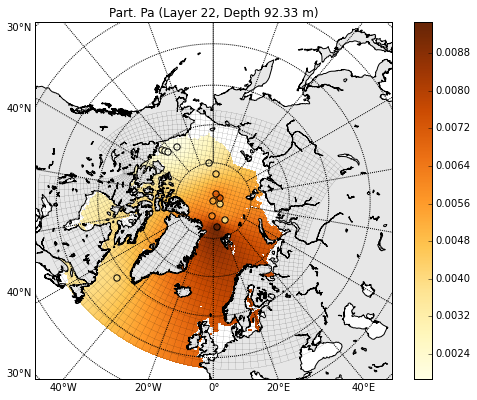

z_ma [0.004 0.006999999999999999 0.006869185105611013 0.006 0.016580655271809353
 0.003931794596345817 0.004 -- 0.001852823718985526 0.0038339144446756256
 0.005399086792845369 0.005343057469894987 0.0021114345502385597
 0.0020134811 0.0014921406991537127 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


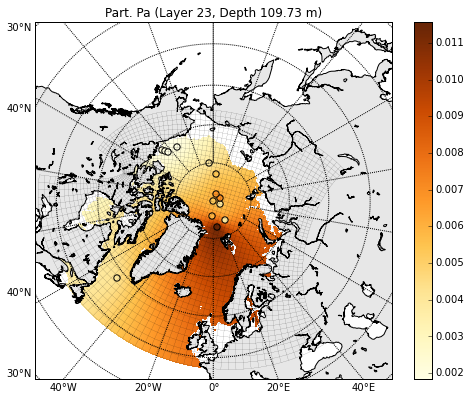

z_ma [0.004 0.006999999999999999 0.00682249763086538 0.006 0.021070656414489353
 0.0037701841068417037 0.004 -- 0.0019640497617618865 0.00465601997824003
 0.006470152389951063 0.005474796109443965 0.0016258124169512642
 0.0020134811 0.0015492049628500432 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


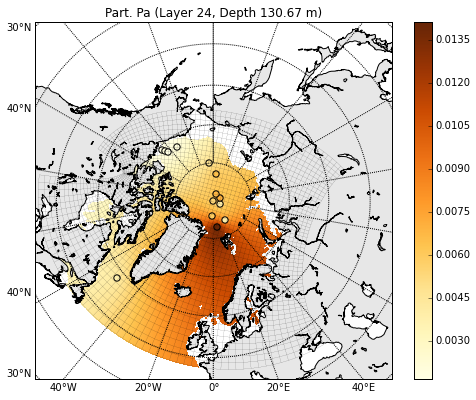

z_ma [0.004 0.006999999999999999 0.006763077208461848 0.006 0.02678520332335481
 0.0035644980292910138 0.004 -- 0.002105610179840891 0.005641371284395882
 0.007684308462846991 0.005642463468869936 0.0011076010986944042
 0.0020134811 0.0016218322075544638 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


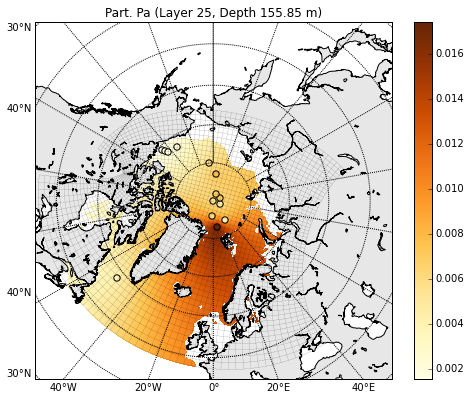

z_ma [0.004 0.006999999999999999 0.006699412470172349 0.006 0.032907932154282074
 0.003344120089058132 0.004 -- 0.0022572820563541095 0.006094577895948249
 0.007512413669465343 0.005822107068254906 0.0008778300923580148
 0.0020134811 0.0016996471125949144 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -134.35
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


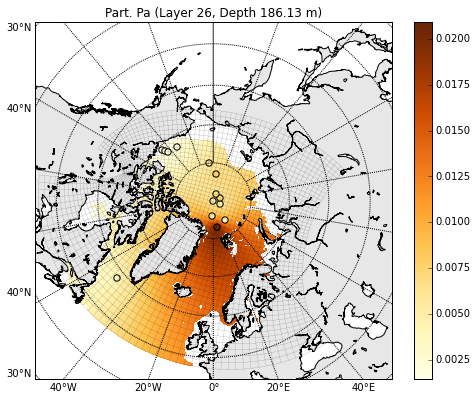

z_ma [0.004 0.006999999999999999 0.006614526152453016 0.006 0.04107157059551844
 0.0030502828354142886 0.004 -- 0.0024595112250384017 0.006698853378018073
 0.007592705261347947 0.006061631867434867 -- 0.0020134811
 0.0018034003193155151 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


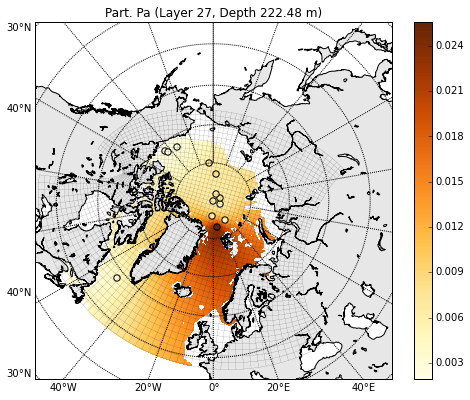

z_ma [0.004 0.006999999999999999 0.006521151202961751 0.006 0.05005157288087844
 0.0027270618564060618 0.004 -- 0.0028105546378740832 0.007363556408294879
 0.008008732264031803 0.006325109146532822 -- 0.0020134811
 0.0019175288467081762 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


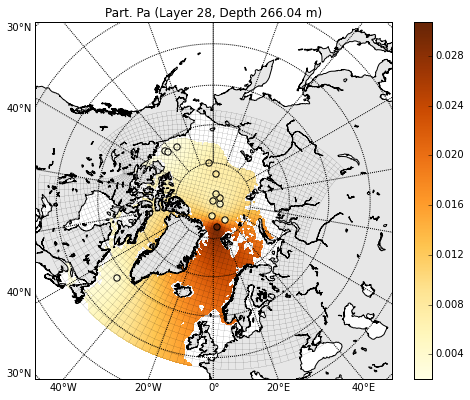

z_ma [0.004 0.006999999999999999 0.006402310358154686 0.006 0.061480666698609354
 0.002315689701304682 0.004 -- 0.003537860608093323 0.008209542083192632
 0.008610859284417372 0.006660443865384766 -- 0.0018934960436492257
 0.0021269449482839444 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


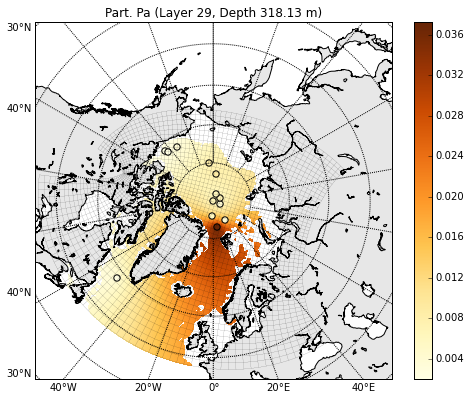

z_ma [0.004 0.006999999999999999 0.006266492249803754 0.006 0.07454248820458753
 0.0018455500954745333 0.004 -- 0.004369067431201025 0.00917638285450435
 0.009533997989615111 0.007043683544072702 -- 0.001506727400516143
 0.002499773332146736 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


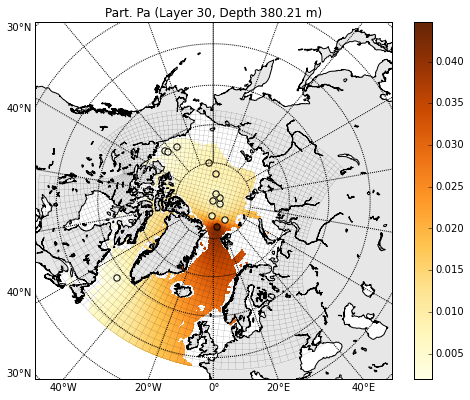

In [9]:
for i in range(20,30,1):
    write_nc(i)

z_ma [0.004 0.006999999999999999 0.006100963930251056 0.006 0.07236118469633106
 0.0012725674508690396 0.004 -- 0.005382100746863538 0.010354720044540506
 0.010659073286574856 0.007510756902473624 -- 0.0012108543007187391
 0.0029541579249795138 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


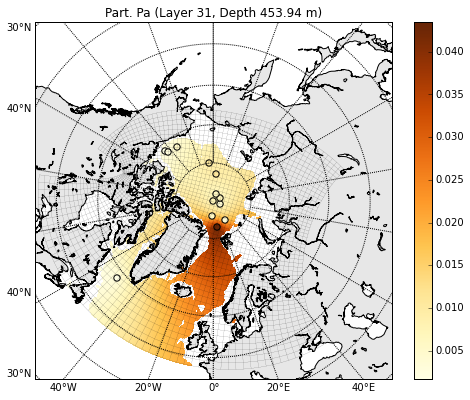

z_ma [0.0040506420350973115 0.006999999999999999 0.0060810272561556975
 0.005940421135179634 0.06221939188681382 0.0011942831849148035 0.004 --
 0.006425393094817414 0.0112 0.011498740128240176 0.008049687700628534 --
 0.003970312961568923 0.003478447839786565 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


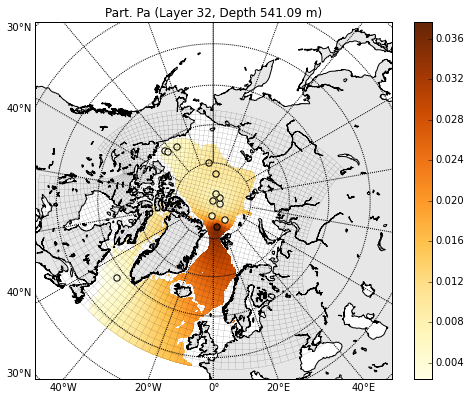

z_ma [0.004179563130133547 0.006999999999999999 0.006287301008213675
 0.005788749258666415 0.05004924051539314 0.0015909634773339913 0.004 --
 0.0075083302931217965 0.0112 0.011969797975487962 0.008696404658414425 --
 0.0033555046663065503 0.004193619756669621 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


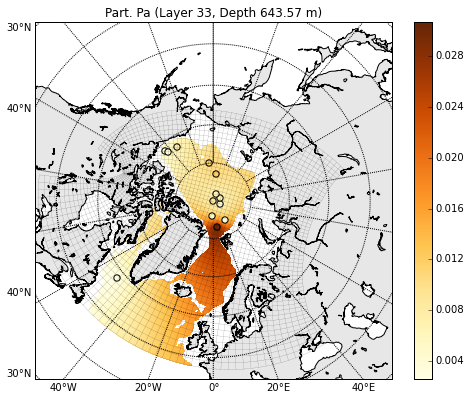

z_ma [0.004329971074342489 0.006999999999999999 0.006527953718947982
 0.00561179873606766 0.035850730582069015 0.002 0.004 --
 0.00877175702447691 0.0112 0.012519365463943713 0.009450907775831298 --
 0.0035601526031227857 0.005038153143821509 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


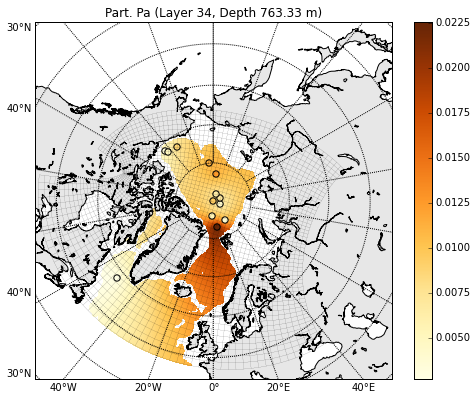

z_ma [0.004501865867724137 0.006999999999999999 0.006802985388358619
 0.005409569567383368 0.019623862086841443 0.002 0.004 --
 0.010210697641618388 0.0112 0.013147442593607426 0.010313197052879154 --
 0.0036457532824815233 0.008280163357345986 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


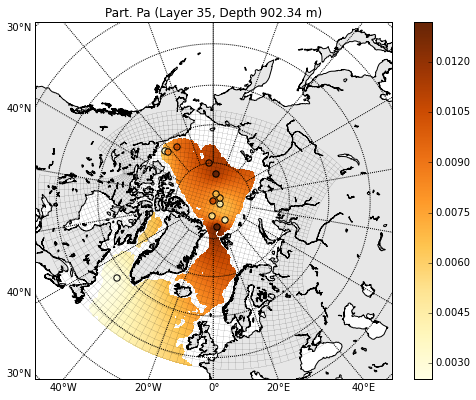

z_ma [0.00470240979333606 0.006999999999999999 0.007218568828242992
 0.005173635537251694 0.008 0.002 0.004 -- 0.011360482815126744 0.0112
 0.014006998118895237 0.011319201209434984 -- 0.003996222537557997
 0.009689776456130306 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


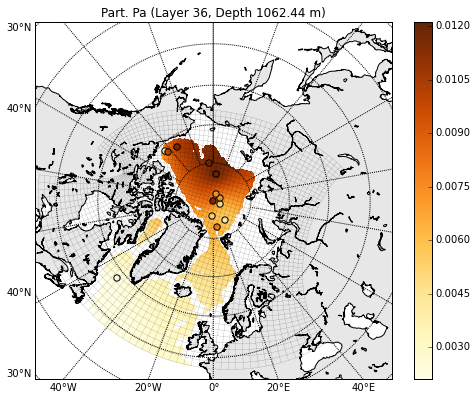

z_ma [0.004931602851178257 0.007126411404713029 0.007865702168032725
 0.005261129123770423 0.008 0.002 0.004 -- 0.012674523013422008 0.0112
 0.01631924191256133 0.012468920245498793 -- 0.0047700212845520566
 0.007808537913720564 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


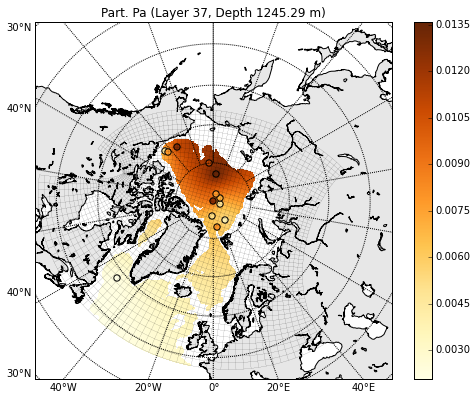

z_ma [0.005606224132002334 0.008157780165002917 0.008593727175296178
 0.006086224132002334 0.008 0.002 0.004 -- 0.014152818236504182 0.0112
 0.019541002872995362 0.013762354161070574 -- 0.006739276176636411
 0.01186081252479892 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


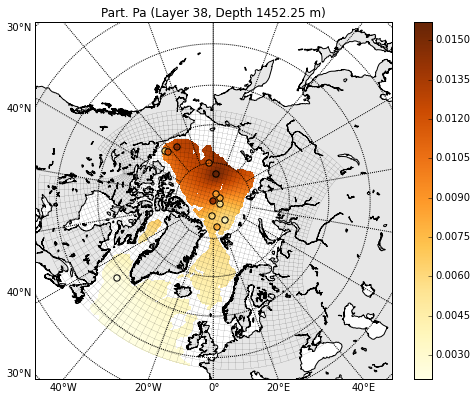

z_ma [0.006538275900560604 0.009322844875700755 0.009416125794612297
 0.007018275900560604 0.008 0.0012309626035827042 0.0035078160662929308 --
 0.011061879558615897 0.0112 0.02318039951348566 0.015223455436068331 --
 0.012371789438975869 0.01455263268798416 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -135.3
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


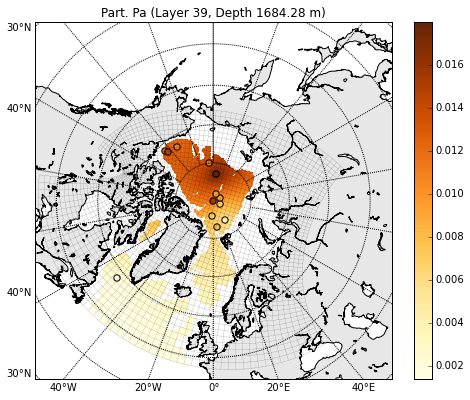

z_ma [0.007569644660850493 0.010612055826063116 0.01027723349563787
 0.008049644660850492 0.00874545679989033 0.002619289321700984
 0.0028202368927663386 -- 0.017714208062485675 0.0112 0.0272076007140282
 0.01684024783053306 -- -- 0.0239294227557509 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- --
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- -- 72.45 --
 -- --]
zzz_ma 12
xxx_dis 12
yyy_dis 12


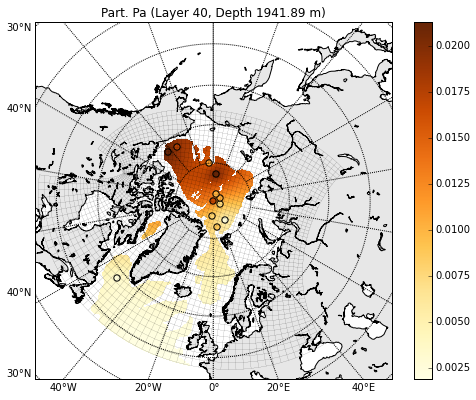

z_ma [0.008700330412872 0.011984752190346 0.011125247809654 0.008954917396782001
 0.015246899874013994 0.005304731404098038 0.002066446391418667 --
 0.0227563051308444 0.0112 0.0302 0.018612731344464763 -- --
 0.0264604520021756 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- --
 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- -- 72.45 --
 -- --]
zzz_ma 12
xxx_dis 12
yyy_dis 12


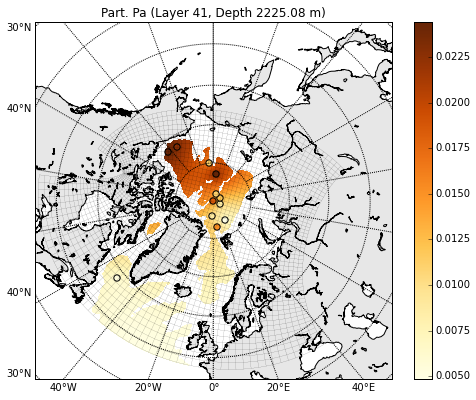

z_ma [0.008302250132531157 0.011062250132531157 0.012047749867468845
 0.008647416710843719 0.02231941565059447 0.007739333686749749
 0.00802844350200067 -- 0.030603799045775676 0.0112 0.0302
 0.019203080299655808 -- -- -- -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 -- -- --
 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- -- -- -- --
 --]
zzz_ma 11
xxx_dis 11
yyy_dis 11


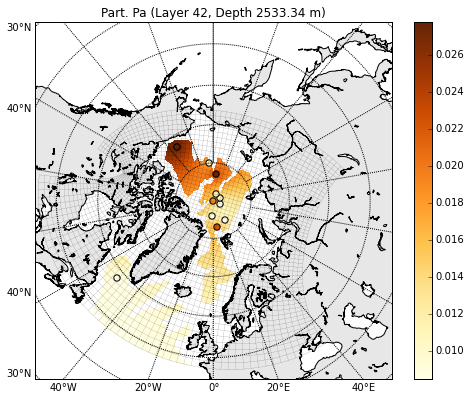

z_ma [0.007305260330917598 0.010065260330917598 0.012985086776972533
 0.008315086776972532 0.029963004129631758 0.005080694215780258
 0.01511814875791931 -- 0.0377821256173933 -- -- -- -- -- -- -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -- -- -- -- -- -- -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 -- -- -- -- -- -- -- -- --]
zzz_ma 8
xxx_dis 8
yyy_dis 8


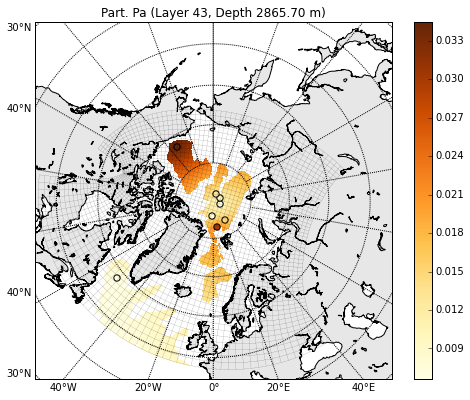

z_ma [0.006239512611951379 0.009000812313414368 0.012629837537317128
 0.00812048738804862 0.027588212910488394 0.007852843096950285
 0.0170215001658539 -- 0.04070000000000001 -- -- -- -- -- -- -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -51.0 30.0 -- -146.0 -- -- -- -- -- -- -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 58.0 84.0 -- 73.0 -- -- -- -- -- -- -- -- --]
zzz_ma 8
xxx_dis 8
yyy_dis 8
set values of layer 43 for the rest


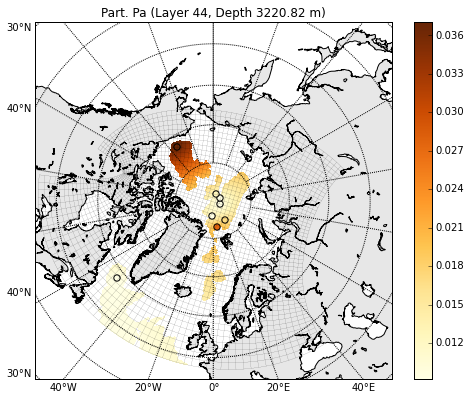

In [10]:
for i in range(30,44,1):
    write_nc(i)

#write the nc file

In [66]:
print ANHAdep.shape

(50,)


In [67]:
lat = nav_lat
lon = nav_lon
print lat.shape
xmax = lat.shape[1]
ymax = lat.shape[0]
depthtmax = NEMO_dep.shape[0]
print depthtmax
import os
os.remove("/ocean/xiaoxiny/research/data/data_ANHA_Pa_part.nc")
nemo = nc.Dataset('/ocean/xiaoxiny/research/data/data_ANHA_Pa_part.nc', 'w')
nemo.description = 'Initial part. Pa value' 

# dimensions
nemo.createDimension('x', xmax)
nemo.createDimension('y', ymax)
nemo.createDimension('deptht',depthtmax)
nemo.createDimension('time_counter', None)

# variables
# latitude and longitude
my_lat = nemo.createVariable('nav_lat','float32',('y','x'),zlib=True)
my_lat[:,:] = lat[:,:] 
x = nemo.createVariable('nav_lon','float32',('y','x'),zlib=True)
x[:,:]  = lon[:,:] 
# time
time_counter = nemo.createVariable('time_counter', 'float32', ('time_counter'),zlib=True)
time_counter.units = 'non-dim'
time_counter[0] = 1
# depth
depth = nemo.createVariable('deptht', 'float32', ('deptht'),zlib=True)
depth.units = 'meter'
depth[:] = ANHAdep[:]

Pa = nemo.createVariable('Pa_part', 'float32', ('time_counter','deptht','y','x'), zlib=True)
Pa._units = 'arbitrary'
Pa[:,:,:,:]=Pa_ini[:,:,:,:]
nemo.close()

(800, 544)
50


In [12]:
#test .nc file

In [68]:
import glob,csv
nc_filename=glob.glob('/ocean/xiaoxiny/research/data/data_ANHA_Pa_part.nc')
print("found *.nc file: \n{}".format(nc_filename))

found *.nc file: 
['/ocean/xiaoxiny/research/data/data_ANHA_Pa_part.nc']


In [69]:
ptrc=nc.Dataset(nc_filename[0])
print ptrc.variables
lat=ptrc.variables['nav_lat'][:]
dept=ptrc.variables['deptht'][:]
Pa_diss=ptrc.variables['Pa_part'][:]

OrderedDict([(u'nav_lat', <netCDF4.Variable object at 0x7fa2766ff5a8>), (u'nav_lon', <netCDF4.Variable object at 0x7fa2766ff640>), (u'time_counter', <netCDF4.Variable object at 0x7fa2766ff808>), (u'deptht', <netCDF4.Variable object at 0x7fa2766ff510>), (u'Pa_part', <netCDF4.Variable object at 0x7fa2766ff9d0>)])


In [70]:
#test input
Pa_diss[0,0,0,0:10]-Pa_ini[0,0,0,0:10]

array([  6.68991702e-11,   3.79828864e-11,   4.59852234e-11,
        -9.30436088e-11,  -9.71530781e-11,   8.30129906e-11,
         3.13828230e-11,   3.06076579e-11,  -1.02094610e-10,
        -8.36194660e-11])

In [72]:
dept-ANHAdep

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.], dtype=float32)

In [73]:
lat

array([[-20.07611084, -20.07611084, -20.07611084, ..., -20.07611084,
        -20.07611084, -20.07611084],
       [-19.8411274 , -19.8411274 , -19.8411274 , ..., -19.8411274 ,
        -19.8411274 , -19.8411274 ],
       [-19.605793  , -19.605793  , -19.605793  , ..., -19.605793  ,
        -19.605793  , -19.605793  ],
       ..., 
       [ 56.78784561,  56.80397415,  56.82052612, ...,  54.60116577,
         54.53417206,  54.46720886],
       [ 56.71054459,  56.72655106,  56.74296951, ...,  54.52142715,
         54.45484543,  54.38829041],
       [ 56.63286972,  56.64875031,  56.66504288, ...,  54.44150543,
         54.37533569,  54.30919266]], dtype=float32)